# 1. Problem 🧐

Identify that the compound is **toxic** or **non-toxic**.

Data:
* CSV (IC50 values, MACCS keys, Klekota-Roth and PubChem substructure fingerprints)
* SDF (series of molfiles)

MACCS keys:
* List of 166 (keys) binary values (0 or 1) which characterize a molecule.
Details: https://github.com/rdkit/rdkit-orig/blob/master/rdkit/Chem/MACCSkeys.py

Klekota-Roth fingerprints:
* Set of 4860 chemical substructures (binary values).
Details: 

PubChem fingerprints:
* 881 binary bits (indicate the presence or absence of a certain group of chemical features in a compound).
Details: https://web.cse.ohio-state.edu/~zhang.10631/bak/drugreposition/list_fingerprints.pdf



### 1.1 Libraries 📖

In [1]:
import sys
sys.path.append('..')

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import MolToSmiles

pd.set_option('display.max_columns', None)

colors_palette = ['#ffa600','#ff6361','#bc5090','#58508d', '#65345a']

### 1.2 Functions

In [2]:
def annotate(ax, fontsize=12):
    for p in ax.patches:
        ax.annotate(format(p.get_height(), ','), 
               (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', 
               xytext = (0, 6), textcoords = 'offset points', fontsize=fontsize)

# 2. Cardiotoxicity 🫀

## 2.1 Data Analyse and Preprocessing 📊

In [3]:
data_path_cardio = "data/raw/cardiotoxicity_hERG_MACCSFP_ready_set.csv" 
df_cardio = pd.read_csv(data_path_cardio)
print("Examples: {0}, columns: {1}".format(df_cardio.shape[0],df_cardio.shape[1]))
df_cardio.head()

Examples: 11504, columns: 167


,IC50,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,645.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1,1,1,1,0
1,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,1600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,6700.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [4]:
df_cardio_pubch = pd.read_csv("data/raw/cardio_pubchem.csv")
print("Examples: {0}, columns: {1}".format(df_cardio_pubch.shape[0],df_cardio_pubch.shape[1]))
df_cardio_pubch.head()

Examples: 11504, columns: 882


,Name,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,PubchemFP

In [5]:
df_cardio_klek = pd.read_csv("data/raw/cardiotoxicity_hERG_KlekFP_ready_set.csv")
print("Examples: {0}, columns: {1}".format(df_cardio_klek.shape[0],df_cardio_klek.shape[1]))
df_cardio_klek.head()

/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Examples: 11504, columns: 4861


IC50  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  KRFP9  \
0   645.0      0      0      0      0      0      0      0      0      0   
1  6600.0      0      0      0      0      0      0      0      0      0   
2  1600.0      0      0      0      0      0      0      0      0      0   
3  6700.0      0      0      0      0      0      0      0      0      0   
4  6600.0      0      0      0      0      0      0      0      0      0   

   KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  KRFP18  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  KRFP27  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  KRFP36  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  KRFP45  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  KRFP54  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  KRFP63  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  KRFP72  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  KRFP81  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   

### 2.1.1 Missing/Invalid values 🔎

In [6]:
# count missing values
print("Missing values: {0}".format(df_cardio.isnull().sum().sum()))
print("Missing values: {0}".format(df_cardio_pubch.isnull().sum().sum()))
print("Missing values: {0}".format(df_cardio_klek.isnull().sum().sum()))

Missing values: 0
Missing values: 0
Missing values: 0


In [7]:
# Convert non-numeric entries to NaN (everything that cannot be converted to a numeric value)
df_cardio2 = (df_cardio.drop(df_cardio.columns, axis=1)
         .join(df_cardio[df_cardio.columns].apply(pd.to_numeric, errors='coerce')))

In [8]:
print("Invalid values: {0}".format(df_cardio2.isnull().sum().sum()))
index_list = df_cardio2[df_cardio2['IC50'].isnull()].index.tolist()
print("Invalid values examples:")
print(df_cardio['IC50'].iloc[index_list])
to_drop = index_list

Invalid values: 869
Invalid values examples:
15                   '='
16                   '='
29                   '='
30       27}]TRIACONTA-8
43                   '='
              ...       
11421                '='
11454                '='
11480                '='
11482                '>'
11483                '>'
Name: IC50, Length: 869, dtype: object


In [9]:
# and then keep only rows where all values are not null
df_cardio2 = df_cardio2[df_cardio2[df_cardio.columns].notnull().all(axis=1)]
df_cardio2

,IC50,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,645.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1,1,1,1,0
1,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,1600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,6700.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [10]:
# find the IC50 zero values and drop them
zeros_list = df_cardio2[df_cardio2['IC50']==0.0].index.tolist()
print(zeros_list)
df_cardio2 = df_cardio2[df_cardio2['IC50']!=0.0]
to_drop.extend(zeros_list)
df_cardio2

[4347]


,IC50,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,645.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1,1,1,1,0
1,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,1600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,6700.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

### 2.1.2 Class balance/Outliers

In [46]:
df_cardio2['IC50'].describe()

count    1.063400e+04
mean     3.182548e+05
std      1.400203e+07
min      1.400000e-01
25%      2.034250e+03
50%      1.000000e+04
75%      3.000000e+04
max      1.000000e+09
Name: IC50, dtype: float64

In [47]:
toxic = df_cardio2[df_cardio2['IC50']<=1000].count()[0]
non_toxic = df_cardio2[df_cardio2['IC50']>1000].count()[0]
all_tox = df_cardio2['IC50'].count()
print('For 1000: {0} Toxic compounds and {1} non toxic compounds'.format(toxic, non_toxic))
print('For 1000: {:.2%} Toxic compounds and {:.2%} non toxic compounds'.format(toxic/all_tox, non_toxic/all_tox))
toxic = df_cardio2[df_cardio2['IC50']<=10000].count()[0]
non_toxic = df_cardio2[df_cardio2['IC50']>10000].count()[0]
print('For 10000: {0} Toxic compounds and {1} non toxic compounds'.format(toxic, non_toxic))
print('For 10000: {:.2%} Toxic compounds and {:.2%} non toxic compounds'.format(toxic/all_tox, non_toxic/all_tox))

For 1000: 1841 Toxic compounds and 8793 non toxic compounds
For 1000: 17.31% Toxic compounds and 82.69% non toxic compounds
For 10000: 6208 Toxic compounds and 4426 non toxic compounds
For 10000: 58.38% Toxic compounds and 41.62% non toxic compounds


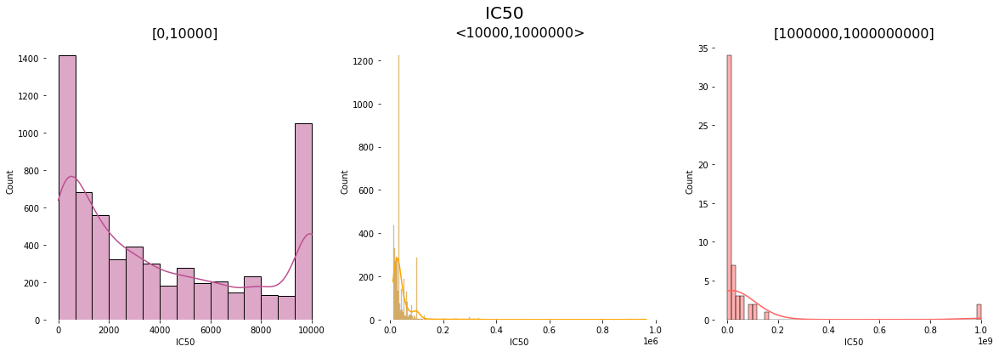

In [48]:
IC_50_1 = df_cardio2[df_cardio2['IC50']<=10000]
IC_50_2 = df_cardio2[df_cardio2['IC50'].between(10000, 1000000, inclusive=False)]
IC_50_3 = df_cardio2[df_cardio2['IC50'].between(1000000,1000000000, inclusive=True)]

fig, axes = plt.subplots(1, 3, figsize = (20, 6))
fig.suptitle('IC50', fontsize=20)
left = sns.histplot(data=IC_50_1, x='IC50', ax = axes[0], kde=True, color=colors_palette[2])
center = sns.histplot(data=IC_50_2, x='IC50', ax = axes[1], kde=True, color=colors_palette[0])
right = sns.histplot(data=IC_50_3, x='IC50', ax = axes[2], kde=True, color=colors_palette[1])
axes[0].set_title('[0,10000]', fontsize=16)
axes[1].set_title('<10000,1000000>', fontsize=16)
axes[2].set_title('[1000000,1000000000]', fontsize=16)

sns.despine(left=True, bottom=True)

In [49]:
df_scaled = StandardScaler().fit_transform(df_cardio2['IC50'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-0.02273025]
 [-0.02273024]
 [-0.02273024]
 [-0.02273023]
 [-0.02273023]
 [-0.02273023]
 [-0.02273023]
 [-0.02273022]
 [-0.02273021]
 [-0.02273021]]

outer range (high) of the distribution:
[[ 4.4836665 ]
 [ 4.58863397]
 [ 4.69604644]
 [ 6.0562317 ]
 [ 6.95685193]
 [ 7.11942729]
 [ 7.11942729]
 [11.29682661]
 [71.39884517]
 [71.39884517]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


In [11]:
# drop 2 outliers
to_drop.extend(df_cardio2[df_cardio2['IC50']>=1000000000].index)
df_cardio2 = df_cardio2[df_cardio2['IC50']<1000000000]
df_cardio2

,IC50,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,645.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1,1,1,1,0
1,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,1600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,6700.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,6600.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [51]:
df_cardio2['IC50'].describe()

count    1.063200e+04
mean     1.302033e+05
std      2.837080e+06
min      1.400000e-01
25%      2.030000e+03
50%      1.000000e+04
75%      3.000000e+04
max      1.584893e+08
Name: IC50, dtype: float64

### 2.1.3 Convert IC50 to pIC50

1. Convert nM to M.
2. Apply -log10.

IC50 -> higher values are better: <=10000 nM -> active (toxic)

pIC50 -> lower values are better (higher values -> stronger inhibitors): >=5.0 -> active (toxic).

In [12]:
df_cardio2 = df_cardio2.assign(IC50 = -np.log10(df_cardio2.IC50*(10**-9)))
df_cardio2.rename(columns={"IC50": "pIC50"}, inplace = True)
df_cardio2

,pIC50,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,6.190440,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1,1,1,1,0
1,5.180456,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,5.795880,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,5.173925,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,5.180456,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [53]:
df_cardio2['pIC50'].describe()

count    10632.000000
mean         5.234620
std          0.951665
min          0.800000
25%          4.522879
50%          5.000000
75%          5.692504
max          9.853872
Name: pIC50, dtype: float64

### 2.1.4 Classes statistics 📈

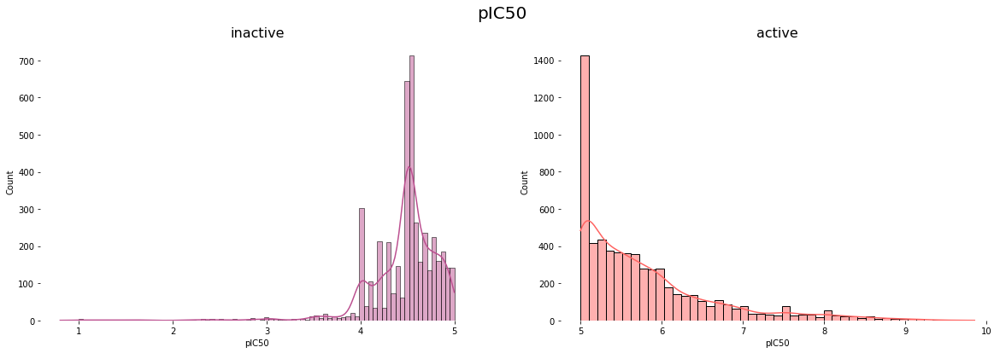

In [32]:
IC_50_1 = df_cardio2[df_cardio2['pIC50']<5]
IC_50_2 = df_cardio2[df_cardio2['pIC50']>=5]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('pIC50', fontsize=20)
left = sns.histplot(data=IC_50_1, x='pIC50', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=IC_50_2, x='pIC50', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('inactive', fontsize=16)
axes[1].set_title('active', fontsize=16)

sns.despine(left=True, bottom=True)

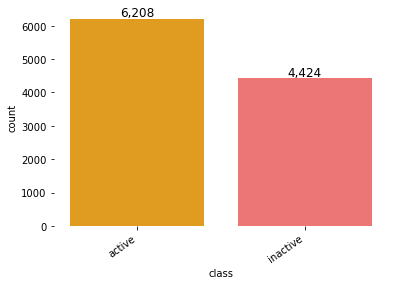

In [33]:
activity_th = []
for i in df_cardio2.pIC50:
    if float(i) < 5:
        activity_th.append("inactive")
    elif float(i) >= 5:
        activity_th.append("active")
    
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_cardio2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'pIC50 value')

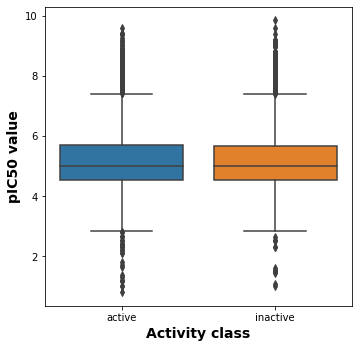

In [34]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'pIC50', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('pIC50 value', fontsize=14, fontweight='bold')

### 2.1.5 Prepare other fingerprints

In [13]:
to_drop.sort(reverse=True)

In [58]:
df_cardio_pubch.drop('Name', axis=1, inplace=True)
df_cardio_pubch.apply(pd.to_numeric, errors='coerce')
df_cardio_pubch.drop(to_drop, axis=0, inplace=True)
df_cardio_pubch = df_cardio_pubch.join(df_cardio2['pIC50'])
df_cardio_pubch

,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,PubchemFP315,P

In [59]:
df_cardio_klek.drop('IC50', axis=1, inplace=True)
df_cardio_klek.apply(pd.to_numeric, errors='coerce')
df_cardio_klek.drop(to_drop, axis=0, inplace=True)
df_cardio_klek = df_cardio_klek.join(df_cardio2['pIC50'])
df_cardio_klek

KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  KRFP9  KRFP10  \
0          0      0      0      0      0      0      0      0      0       0   
1          0      0      0      0      0      0      0      0      0       0   
2          0      0      0      0      0      0      0      0      0       0   
3          0      0      0      0      0      0      0      0      0       0   
4          0      0      0      0      0      0      0      0      0       0   
...      ...    ...    ...    ...    ...    ...    ...    ...    ...     ...   
11499      1      1      0      0      0      0      0      0      0       0   
11500      1      1      0      0      0      0      0      0      0       0   
11501      1      1      0      0      0      0      0      0      0       0   
11502      1      0      0      0      0      0      0      0      0       0   
11503      1      0      0      0      0      0      0      0      0       0   

       KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  KRFP18  KRFP19  \
0           0       0       0       0       0       0       0       0       0   
1           0       0       0       0       0       0       0       0       0   
2           0       0       0       0       0       0       0       0       0   
3           0       0       0       0       0       0       0       0       0   
4           0       0       0       0       0       0       0       0       0   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
11499       0       0       0       1       0       0       0       1       0   
11500       0       0       0       0       0       0       0       0       0   
11501       0       0       0       0       0       0       1       0       0   
11502       0       0       0       0       0       1       0       1       0   
11503       0       0       0       0       0       0       0       0       0   

       KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  KRFP27  KRFP28  \
0           0       0       0       0       0       0       0       0       0   
1           0       0       0       0       0       0       0       0       0   
2           0       0       0       0       0       0       0       0       0   
3           0       0       0       0       0       0       0       0       0   
4           0       0       0       0       0       0       0       0       0   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
11499       1       0       0       0       0       0       0       0       0   
11500       0       0       0       0       0       0       0       0       0   
11501       0       0       0       0       0       0       0       0       0   
11502       0       0       0       0       0       0       0       0       0   
11503       0       0       0       0       0       0       0       0       0   

       KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  KRFP36  KRFP37  \
0           0       0       0       0       0       0       0       0       0   
1           0       0       0       0       0       0       0       0       0   
2           0       0       0       0       0       0       0       0       0   
3           0       0       0       0       0       0       0       0       0   
4           0       0       0       0       0       0       0       0       0   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
11499       0       0       0       0       0       0       0       0       0   
11500       0       0       0       0       0       0       0       0       0   
11501       0       0       0       0       0       0       0       0       0   
11502       0       0       0       0       0       0       0       0       0   
11503       0       0       0       0       0       0       0       0       0   

       KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  KRFP45  KRFP46  \
0           0       0       0       0       0 

### 2.1.6 Save

In [60]:
df_cardio2.to_csv('data/processed/cardio_maccs_all.csv', index=False)
df_cardio_pubch.to_csv('data/processed/cardio_pubchem_all.csv', index=False)
df_cardio_klek.to_csv('data/processed/cardio_klek_all.csv', index=False)

## 2.2 SDF 

Prepare SDF file with mols. 

### 2.2.1 Load data

In [14]:
suppl = Chem.SDMolSupplier('data/raw/hERG_all_human_data_filtered_11504cmds.sdf')
ms = [x for x in suppl if x is not None]
len(ms)

11504

### 2.2.2 Preprocess

Convert mols to smiles.

In [15]:
cardio_smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms ]
df_cardio_smiles = pd.DataFrame(cardio_smiles, columns=['smiles'])
df_cardio_smiles

,smiles
0,CNCc1ccc(Cl)cc1Oc1ccc(Cl)cc1
1,Cc1nc2ccccc2c(=O)n1-c1ccc(OCCCN2CCCCCC2)cc1
2,Cc1cccc2c(=O)n(-c3ccc(OCCCN4CCCC4)cc3)c(C)nc12
3,Cc1ccc2c(=O)n(-c3ccc(OCCCN4CCCC4)cc3)c(C)nc2c1
4,Cc1cccc2nc(C)n(-c3ccc(OCCCN4CCCC4)cc3)c(=O)c12
...,...
11499,CC1OC2(CCN(CCc3ccccc3F)CC2)CN(c2ncccc2C(F)(F)F...
11500,Cn1nccc1C1CCCC1Oc1cc(F)c(S(=O)(=O)Nc2nccs2)cc1F
11501,OC(c1cccnc1-c1cccc(Cl)c1)C(c1cccnc1)c1cccnc1
11502,CCOc1cc(C(=O)Nc2cc(C(F)(F)F)ccn2)ccc1-c1nc(C23...


Drop.

In [16]:
len(to_drop)

872

In [17]:
df_cardio_smiles.drop(to_drop, axis=0, inplace=True)
df_cardio_smiles

,smiles
0,CNCc1ccc(Cl)cc1Oc1ccc(Cl)cc1
1,Cc1nc2ccccc2c(=O)n1-c1ccc(OCCCN2CCCCCC2)cc1
2,Cc1cccc2c(=O)n(-c3ccc(OCCCN4CCCC4)cc3)c(C)nc12
3,Cc1ccc2c(=O)n(-c3ccc(OCCCN4CCCC4)cc3)c(C)nc2c1
4,Cc1cccc2nc(C)n(-c3ccc(OCCCN4CCCC4)cc3)c(=O)c12
...,...
11499,CC1OC2(CCN(CCc3ccccc3F)CC2)CN(c2ncccc2C(F)(F)F...
11500,Cn1nccc1C1CCCC1Oc1cc(F)c(S(=O)(=O)Nc2nccs2)cc1F
11501,OC(c1cccnc1-c1cccc(Cl)c1)C(c1cccnc1)c1cccnc1
11502,CCOc1cc(C(=O)Nc2cc(C(F)(F)F)ccn2)ccc1-c1nc(C23...


Join.

In [18]:
df_cardio_smiles = df_cardio_smiles.join(df_cardio2['pIC50'])
df_cardio_smiles

,smiles,pIC50
0,CNCc1ccc(Cl)cc1Oc1ccc(Cl)cc1,6.190440
1,Cc1nc2ccccc2c(=O)n1-c1ccc(OCCCN2CCCCCC2)cc1,5.180456
2,Cc1cccc2c(=O)n(-c3ccc(OCCCN4CCCC4)cc3)c(C)nc12,5.795880
3,Cc1ccc2c(=O)n(-c3ccc(OCCCN4CCCC4)cc3)c(C)nc2c1,5.173925
4,Cc1cccc2nc(C)n(-c3ccc(OCCCN4CCCC4)cc3)c(=O)c12,5.180456
...,...,...
11499,CC1OC2(CCN(CCc3ccccc3F)CC2)CN(c2ncccc2C(F)(F)F...,5.180456
11500,Cn1nccc1C1CCCC1Oc1cc(F)c(S(=O)(=O)Nc2nccs2)cc1F,4.000000
11501,OC(c1cccnc1-c1cccc(Cl)c1)C(c1cccnc1)c1cccnc1,4.522879
11502,CCOc1cc(C(=O)Nc2cc(C(F)(F)F)ccn2)ccc1-c1nc(C23...,4.585027


In [19]:
df_cardio_smiles.isnull().values.any()

False

### 2.2.3 Save

In [20]:
df_cardio_smiles.to_csv('data/processed/cardio_smiles_all.csv', index=False)

# 3. Hepatotoxicity 💀

## 3.1 Loading and cleaning 🧹

In [3]:
def load_and_clean(path, target,):
    df = pd.read_csv(path, sep="\t")
    raw_data = list(df['Field 11'])
    cols = raw_data[0].split(',')
    cols[0] = target
    last = raw_data[-1]
    raw_data = raw_data[1:-1]
    rep_data = []
    for i in range(0, len(raw_data)-1, 2):
        rep_data.append(raw_data[i].split(',') + (raw_data[i+1].split(','))[1:])
    rep_data.append(last.split(','))
    return pd.DataFrame(rep_data, columns = cols)

In [4]:
data_path_hep = "data/raw/hepatotoxicity_ALT_MACCSFP_ready_set.csv" 
df_hep = pd.read_csv(data_path_hep, sep=",")
print("Examples: {0}, columns: {1}".format(df_hep.shape[0],df_hep.shape[1]))
df_hep.head()

Examples: 196, columns: 1


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,Field 11
NaN,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
32.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,0,1,1,1,1,1,0
37.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,0,1,1,1,1,1,0


In [37]:
df_hep_alt = load_and_clean("data/raw/hepatotoxicity_ALT_MACCSFP_ready_set.csv", 'ALT')
print("Examples: {0}, columns: {1}".format(df_hep_alt.shape[0],df_hep_alt.shape[1]))
df_hep_alt.head()

Examples: 98, columns: 167


,ALT,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,32.60,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,0,1,1,1,1,1,0
1,37.20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,0,1,1,1,1,1,0
2,2.92,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,3.16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,1,1,1,0,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,1,0,0,1,1,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
4,44.10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,1,1,1,0,0,0,1,1,0,0,0,1,1,1,0,1,1,1,0,1,1,0,0,1,0,0,0,1,1,1,1,1,0,1,1,1,0,1,0,1,1,0,0,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [38]:
df_hep_td = load_and_clean("data/raw/hepatotoxicity_pTD50_MACCSFP_ready_set.csv", 'pTD50')
print("Examples: {0}, columns: {1}".format(df_hep_td.shape[0],df_hep_td.shape[1]))
df_hep_td.head()

Examples: 54, columns: 167


,pTD50,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,1.94,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0
1,1.58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
2,3.69,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2.46,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1,0,0,0,0,0,1,1,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,1,1,0,1,1,1,1,1,0
4,1.90,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0


In [7]:
df_hep_pubchem_alt = pd.read_csv("data/raw/hepato_alt_pubchem.csv")
print("Examples: {0}, columns: {1}".format(df_hep_pubchem_alt.shape[0],df_hep_pubchem_alt.shape[1]))
df_hep_pubchem_alt.head()

Examples: 98, columns: 882


,Name,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,PubchemFP

In [8]:
df_hep_pubchem_td = pd.read_csv("data/raw/hepato_ptd50_pubchem.csv")
print("Examples: {0}, columns: {1}".format(df_hep_pubchem_td.shape[0],df_hep_pubchem_td.shape[1]))
df_hep_pubchem_td.head()

Examples: 54, columns: 882


,Name,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,PubchemFP

In [9]:
df_hep_klek_alt = load_and_clean("data/raw/hepatotoxicity_ALT_KlekFP_ready_set.csv", 'ALT')
print("Examples: {0}, columns: {1}".format(df_hep_klek_alt.shape[0],df_hep_klek_alt.shape[1]))
df_hep_klek_alt.head()

Examples: 98, columns: 4861


ALT KRFP1 KRFP2 KRFP3 KRFP4 KRFP5 KRFP6 KRFP7 KRFP8 KRFP9 KRFP10 KRFP11  \
0  32.60     1     0     0     0     0     0     0     0     0      0      0   
1  37.20     1     0     0     0     0     0     0     0     0      0      0   
2   2.92     0     0     0     0     0     0     0     0     0      0      0   
3   3.16     0     0     0     0     0     0     0     0     0      0      0   
4  44.10     1     1     0     0     0     0     0     0     0      0      0   

  KRFP12 KRFP13 KRFP14 KRFP15 KRFP16 KRFP17 KRFP18 KRFP19 KRFP20 KRFP21  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP22 KRFP23 KRFP24 KRFP25 KRFP26 KRFP27 KRFP28 KRFP29 KRFP30 KRFP31  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP32 KRFP33 KRFP34 KRFP35 KRFP36 KRFP37 KRFP38 KRFP39 KRFP40 KRFP41  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      1      0      0      0      0      0      0      0   

  KRFP42 KRFP43 KRFP44 KRFP45 KRFP46 KRFP47 KRFP48 KRFP49 KRFP50 KRFP51  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP52 KRFP53 KRFP54 KRFP55 KRFP56 KRFP57 KRFP58 KRFP59 KRFP60 KRFP61  \
0      0      0      0      1      0      0      0      0      0      0   
1      0      0      0      1      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP62 KRFP63 KRFP64 KRFP65 KRFP66 KRFP67 KRFP68 KRFP69 KRFP70 KRFP71  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP72 KRFP73 KRFP74 KRFP75 KRFP76 KRFP77 KRFP78 KRFP79 KRFP80 KRFP81  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP82 KRFP83 KRFP84 KRFP85 KRFP86 KRFP87 KRFP88 KRFP89 KRFP90 KRFP91  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0   

In [10]:
df_hep_klek_td = load_and_clean("data/raw/hepatotoxicity_pTD50_KlekFP_ready_set.csv", '')
print("Examples: {0}, columns: {1}".format(df_hep_klek_td.shape[0],df_hep_klek_td.shape[1]))
df_hep_klek_td.head()

Examples: 54, columns: 4861


KRFP1 KRFP2 KRFP3 KRFP4 KRFP5 KRFP6 KRFP7 KRFP8 KRFP9 KRFP10 KRFP11  \
0  1.94     0     0     0     0     0     0     0     0     0      0      0   
1  1.58     0     0     0     0     0     0     0     0     0      0      0   
2  3.69     0     0     0     0     0     0     0     0     0      0      0   
3  2.46     0     0     0     0     0     0     0     0     0      0      0   
4  1.90     0     0     0     0     0     0     0     0     0      0      0   

  KRFP12 KRFP13 KRFP14 KRFP15 KRFP16 KRFP17 KRFP18 KRFP19 KRFP20 KRFP21  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP22 KRFP23 KRFP24 KRFP25 KRFP26 KRFP27 KRFP28 KRFP29 KRFP30 KRFP31  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP32 KRFP33 KRFP34 KRFP35 KRFP36 KRFP37 KRFP38 KRFP39 KRFP40 KRFP41  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP42 KRFP43 KRFP44 KRFP45 KRFP46 KRFP47 KRFP48 KRFP49 KRFP50 KRFP51  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP52 KRFP53 KRFP54 KRFP55 KRFP56 KRFP57 KRFP58 KRFP59 KRFP60 KRFP61  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP62 KRFP63 KRFP64 KRFP65 KRFP66 KRFP67 KRFP68 KRFP69 KRFP70 KRFP71  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP72 KRFP73 KRFP74 KRFP75 KRFP76 KRFP77 KRFP78 KRFP79 KRFP80 KRFP81  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP82 KRFP83 KRFP84 KRFP85 KRFP86 KRFP87 KRFP88 KRFP89 KRFP90 KRFP91  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4

## 3.2 Data Analyse and Preprocessing 📊

### 3.2.1 Missing/Invalid values 🔎

In [11]:
# count missing values
print("Missing values: {0}".format(df_hep_alt.isnull().sum().sum()))
print("Missing values: {0}".format(df_hep_td.isnull().sum().sum()))

print("Missing values: {0}".format(df_hep_pubchem_alt.isnull().sum().sum()))
print("Missing values: {0}".format(df_hep_pubchem_td.isnull().sum().sum()))

print("Missing values: {0}".format(df_hep_klek_alt.isnull().sum().sum()))
print("Missing values: {0}".format(df_hep_klek_td.isnull().sum().sum()))

Missing values: 0
Missing values: 0
Missing values: 0
Missing values: 0
Missing values: 0
Missing values: 0


In [12]:
# Convert non-numeric entries to NaN (everything that cannot be converted to a numeric value)
df_hep_alt2 = (df_hep_alt.drop(df_hep_alt.columns, axis=1)
               .join(df_hep_alt[df_hep_alt.columns].apply(pd.to_numeric, errors='coerce')))

print("Invalid values: {0}".format(df_hep_alt2.isnull().sum().sum()))

df_hep_td2 = (df_hep_td.drop(df_hep_td.columns, axis=1)
               .join(df_hep_td[df_hep_td.columns].apply(pd.to_numeric, errors='coerce')))

print("Invalid values: {0}".format(df_hep_td2.isnull().sum().sum()))

Invalid values: 0
Invalid values: 0


### 3.2.2 Class balance/Outliers

In [13]:
df_hep_alt2['ALT'].describe()

count     98.000000
mean      47.119898
std       45.294039
min        1.510000
25%       29.775000
50%       36.300000
75%       49.000000
max      273.000000
Name: ALT, dtype: float64

In [14]:
df_hep_td2['pTD50'].describe()

count    54.000000
mean      2.869074
std       1.247381
min       0.930000
25%       1.992500
50%       2.880000
75%       3.375000
max       8.870000
Name: pTD50, dtype: float64

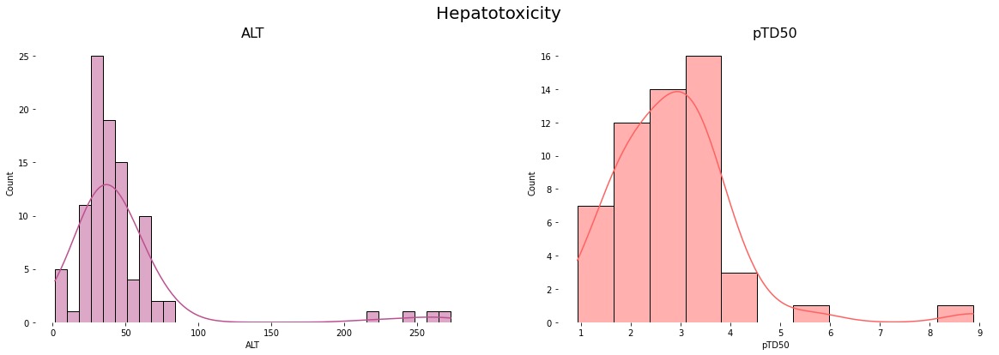

In [15]:
fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Hepatotoxicity', fontsize=20)
left = sns.histplot(data=df_hep_alt2, x='ALT', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=df_hep_td2, x='pTD50', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('ALT', fontsize=16)
axes[1].set_title('pTD50', fontsize=16)

sns.despine(left=True, bottom=True)

In [16]:
df_scaled = StandardScaler().fit_transform(df_hep_alt2['ALT'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-1.0121508 ]
 [-1.00371804]
 [-0.99528528]
 [-0.98086083]
 [-0.97553487]
 [-0.66840489]
 [-0.60183047]
 [-0.60183047]
 [-0.60183047]
 [-0.56632412]]

outer range (high) of the distribution:
[[0.37459432]
 [0.43229215]
 [0.46336021]
 [0.61648138]
 [0.716343  ]
 [0.72965789]
 [3.83646406]
 [4.44672956]
 [4.74631444]
 [5.01261211]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


In [17]:
df_scaled = StandardScaler().fit_transform(df_hep_td2['pTD50'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-1.56911293]
 [-1.42345561]
 [-1.32635073]
 [-1.17260134]
 [-1.08358854]
 [-1.04312817]
 [-1.01885195]
 [-0.92174707]
 [-0.80845805]
 [-0.80036598]]

outer range (high) of the distribution:
[[0.6238389 ]
 [0.64002305]
 [0.66429926]
 [0.74522   ]
 [0.76140414]
 [0.94752183]
 [1.19028402]
 [1.31166512]
 [2.25843768]
 [4.85599316]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


### 3.2.3 Classes statistics 📈

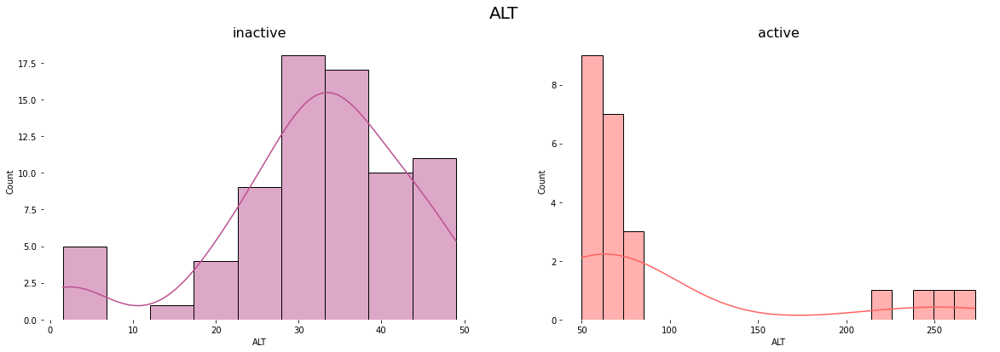

In [18]:
ALT_1 = df_hep_alt2[df_hep_alt2['ALT']<50]
ALT_2 = df_hep_alt2[df_hep_alt2['ALT']>=50]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('ALT', fontsize=20)
left = sns.histplot(data=ALT_1, x='ALT', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=ALT_2, x='ALT', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('inactive', fontsize=16)
axes[1].set_title('active', fontsize=16)

sns.despine(left=True, bottom=True)

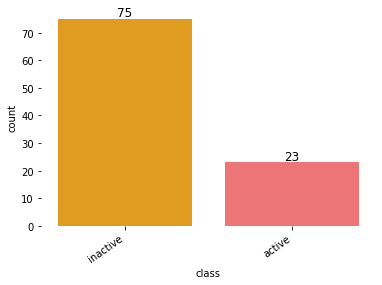

In [20]:
activity_th = []
for i in df_hep_alt2.ALT:
    if float(i) < 50:
        activity_th.append("inactive")
    elif float(i) >= 50:
        activity_th.append("active")
    
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_hep_alt2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'ALT value')

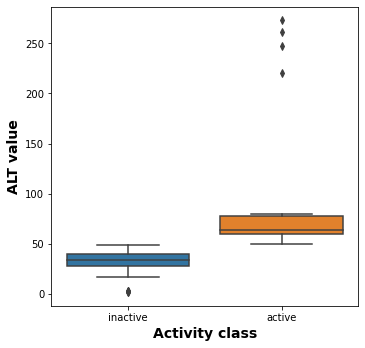

In [21]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'ALT', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('ALT value', fontsize=14, fontweight='bold')

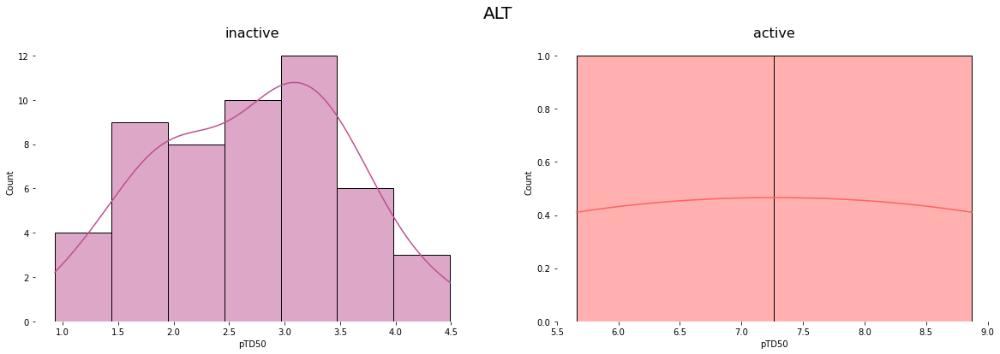

In [22]:
pTD50_1 = df_hep_td2[df_hep_td2['pTD50']<5]
pTD50_2 = df_hep_td2[df_hep_td2['pTD50']>=5]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('ALT', fontsize=20)
left = sns.histplot(data=pTD50_1, x='pTD50', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=pTD50_2, x='pTD50', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('inactive', fontsize=16)
axes[1].set_title('active', fontsize=16)

sns.despine(left=True, bottom=True)

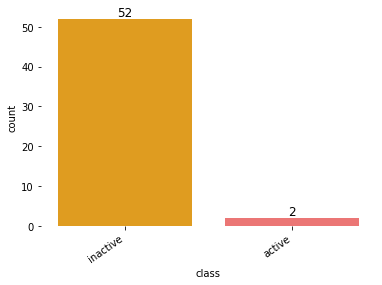

In [23]:
activity_th = []
for i in df_hep_td2.pTD50:
    if float(i) < 5:
        activity_th.append("inactive")
    elif float(i) >= 5:
        activity_th.append("active")
    
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_hep_td2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'pTD50 value')

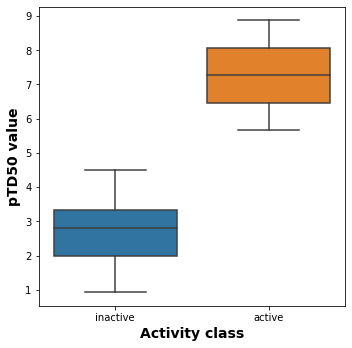

In [24]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'pTD50', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('pTD50 value', fontsize=14, fontweight='bold')

### 3.2.4 Prepare other fingerprints

In [26]:
df_hep_pubchem_alt.drop('Name', axis=1, inplace=True)
df_hep_pubchem_alt.apply(pd.to_numeric, errors='coerce')
df_hep_pubchem_alt = df_hep_pubchem_alt.join(df_hep_alt2['ALT'])
df_hep_pubchem_alt

,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,PubchemFP315,P

In [27]:
df_hep_pubchem_td.drop('Name', axis=1, inplace=True)
df_hep_pubchem_td.apply(pd.to_numeric, errors='coerce')
df_hep_pubchem_td = df_hep_pubchem_td.join(df_hep_td2['pTD50'])
df_hep_pubchem_td

,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,PubchemFP315,P

In [28]:
df_hep_klek_alt.apply(pd.to_numeric, errors='coerce')
df_hep_klek_alt.head()

ALT KRFP1 KRFP2 KRFP3 KRFP4 KRFP5 KRFP6 KRFP7 KRFP8 KRFP9 KRFP10 KRFP11  \
0  32.60     1     0     0     0     0     0     0     0     0      0      0   
1  37.20     1     0     0     0     0     0     0     0     0      0      0   
2   2.92     0     0     0     0     0     0     0     0     0      0      0   
3   3.16     0     0     0     0     0     0     0     0     0      0      0   
4  44.10     1     1     0     0     0     0     0     0     0      0      0   

  KRFP12 KRFP13 KRFP14 KRFP15 KRFP16 KRFP17 KRFP18 KRFP19 KRFP20 KRFP21  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP22 KRFP23 KRFP24 KRFP25 KRFP26 KRFP27 KRFP28 KRFP29 KRFP30 KRFP31  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP32 KRFP33 KRFP34 KRFP35 KRFP36 KRFP37 KRFP38 KRFP39 KRFP40 KRFP41  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      1      0      0      0      0      0      0      0   

  KRFP42 KRFP43 KRFP44 KRFP45 KRFP46 KRFP47 KRFP48 KRFP49 KRFP50 KRFP51  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP52 KRFP53 KRFP54 KRFP55 KRFP56 KRFP57 KRFP58 KRFP59 KRFP60 KRFP61  \
0      0      0      0      1      0      0      0      0      0      0   
1      0      0      0      1      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP62 KRFP63 KRFP64 KRFP65 KRFP66 KRFP67 KRFP68 KRFP69 KRFP70 KRFP71  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP72 KRFP73 KRFP74 KRFP75 KRFP76 KRFP77 KRFP78 KRFP79 KRFP80 KRFP81  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP82 KRFP83 KRFP84 KRFP85 KRFP86 KRFP87 KRFP88 KRFP89 KRFP90 KRFP91  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0   

In [30]:
df_hep_klek_td.apply(pd.to_numeric, errors='coerce')
df_hep_klek_td.head()

KRFP1 KRFP2 KRFP3 KRFP4 KRFP5 KRFP6 KRFP7 KRFP8 KRFP9 KRFP10 KRFP11  \
0  1.94     0     0     0     0     0     0     0     0     0      0      0   
1  1.58     0     0     0     0     0     0     0     0     0      0      0   
2  3.69     0     0     0     0     0     0     0     0     0      0      0   
3  2.46     0     0     0     0     0     0     0     0     0      0      0   
4  1.90     0     0     0     0     0     0     0     0     0      0      0   

  KRFP12 KRFP13 KRFP14 KRFP15 KRFP16 KRFP17 KRFP18 KRFP19 KRFP20 KRFP21  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP22 KRFP23 KRFP24 KRFP25 KRFP26 KRFP27 KRFP28 KRFP29 KRFP30 KRFP31  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP32 KRFP33 KRFP34 KRFP35 KRFP36 KRFP37 KRFP38 KRFP39 KRFP40 KRFP41  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP42 KRFP43 KRFP44 KRFP45 KRFP46 KRFP47 KRFP48 KRFP49 KRFP50 KRFP51  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP52 KRFP53 KRFP54 KRFP55 KRFP56 KRFP57 KRFP58 KRFP59 KRFP60 KRFP61  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP62 KRFP63 KRFP64 KRFP65 KRFP66 KRFP67 KRFP68 KRFP69 KRFP70 KRFP71  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP72 KRFP73 KRFP74 KRFP75 KRFP76 KRFP77 KRFP78 KRFP79 KRFP80 KRFP81  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4      0      0      0      0      0      0      0      0      0      0   

  KRFP82 KRFP83 KRFP84 KRFP85 KRFP86 KRFP87 KRFP88 KRFP89 KRFP90 KRFP91  \
0      0      0      0      0      0      0      0      0      0      0   
1      0      0      0      0      0      0      0      0      0      0   
2      0      0      0      0      0      0      0      0      0      0   
3      0      0      0      0      0      0      0      0      0      0   
4

### 3.2.5 Save

In [31]:
df_hep_alt2.to_csv('data/processed/hepato_alt_maccs_all.csv', index=False)
df_hep_td2.to_csv('data/processed/hepato_ptd50_maccs_all.csv', index=False)

df_hep_pubchem_alt.to_csv('data/processed/hepato_alt_pubchem_all.csv', index=False)
df_hep_pubchem_td.to_csv('data/processed/hepato_ptd50_pubchem_all.csv', index=False)

df_hep_klek_alt.to_csv('data/processed/hepato_alt_klek_all.csv', index=False)
df_hep_klek_td.to_csv('data/processed/hepato_ptd50_klek_all.csv', index=False)

## 3.2 SDF 

Prepare SDF file with mols. 

### 3.2.1 Load data

In [32]:
suppl = Chem.SDMolSupplier('data/raw/hepatotoxicity_chembl_data_ALT_onlynonempty98cmds.sdf')
ms_alt = [x for x in suppl if x is not None]
len(ms_alt)

98

In [33]:
suppl = Chem.SDMolSupplier('data/raw/hepatotoxicity_chembl_data_pTD50_54cmds.sdf')
ms_td = [x for x in suppl if x is not None]
len(ms_td)

54

### 3.2.2 Preprocess

Convert mols to smiles.

In [46]:
smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms_alt]
df_hep_alt_smiles = pd.DataFrame(smiles, columns=['smiles'])
df_hep_alt_smiles.head()

,smiles
0,Clc1ccc(COC(Cn2ccnc2)c2ccc(Cl)cc2Cl)c(Cl)c1
1,Clc1ccc(COC(Cn2ccnc2)c2ccc(Cl)cc2Cl)c(Cl)c1
2,COc1ccc(C=C2SC(=O)N(Cc3ccc(C)cc3)C2=O)c(OC)c1
3,Cc1ccc(CN2C(=O)SC(=Cc3ccc(Cl)cc3)C2=O)cc1
4,CCCOc1ccc(C=CC(=O)NCCCNc2c3c(nc4ccccc24)CCCC3)...


In [47]:
smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms_td]
df_hep_td_smiles = pd.DataFrame(smiles, columns=['smiles'])
df_hep_td_smiles.head()

,smiles
0,Nc1cc(Cl)c(N)c(Cl)c1
1,ClCCl
2,C=CC(=C)Cl
3,O=[N+]([O-])c1ccc2[nH]cnc2c1
4,Nc1ccc(Cl)c(N)c1


In [48]:
df_hep_alt_smiles = df_hep_alt_smiles.join(df_hep_alt2['ALT'])
df_hep_alt_smiles.head()

,smiles,ALT
0,Clc1ccc(COC(Cn2ccnc2)c2ccc(Cl)cc2Cl)c(Cl)c1,32.60
1,Clc1ccc(COC(Cn2ccnc2)c2ccc(Cl)cc2Cl)c(Cl)c1,37.20
2,COc1ccc(C=C2SC(=O)N(Cc3ccc(C)cc3)C2=O)c(OC)c1,2.92
3,Cc1ccc(CN2C(=O)SC(=Cc3ccc(Cl)cc3)C2=O)cc1,3.16
4,CCCOc1ccc(C=CC(=O)NCCCNc2c3c(nc4ccccc24)CCCC3)...,44.10


In [49]:
df_hep_td_smiles = df_hep_td_smiles.join(df_hep_td2['pTD50'])
df_hep_td_smiles.head()

,smiles,pTD50
0,Nc1cc(Cl)c(N)c(Cl)c1,1.94
1,ClCCl,1.58
2,C=CC(=C)Cl,3.69
3,O=[N+]([O-])c1ccc2[nH]cnc2c1,2.46
4,Nc1ccc(Cl)c(N)c1,1.90


### 3.2.3 Save

In [50]:
df_hep_alt_smiles.to_csv('data/processed/hepato_alt_smiles_all.csv', index=False)
df_hep_td_smiles.to_csv('data/processed/hepato_ptd50_smiles_all.csv', index=False)

# 4. Genotoxicity 🧬

## 4.1 Data Analyse and Preprocessing 📊

In [4]:
data_path_geno = "data/raw/genotoxicity_MACCSFP.csv" 
df_geno = pd.read_csv(data_path_geno)
print("Examples: {0}, columns: {1}".format(df_geno.shape[0],df_geno.shape[1]))
df_geno.head()

Examples: 24915, columns: 167


,genotoxicity,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,11220.2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,1,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,1,1,1,1,1,1,1,0
1,25918.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,1,1,0,1,1,0,0,1,1,0,1,1,1,0,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,16353.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,1,1,0,1,0
3,20596.2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,0
4,29081.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,1,1,1,0,1,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,0,0,0,0,1,1,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,1,0,1,0,1,0,0,0,1,1,1,0,0,1,1,0,0,1,1,0,1,1,0,0,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0


In [5]:
df_geno_pubch = pd.read_csv("data/raw/genotoxicity_PubchemFP.csv")
print("Examples: {0}, columns: {1}".format(df_geno_pubch.shape[0],df_geno_pubch.shape[1]))
df_geno_pubch.head()

Examples: 24915, columns: 882


,genotoxicity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,P

In [6]:
df_geno_klek = pd.read_csv("data/raw/genotoxicity_KlekFP.csv")
print("Examples: {0}, columns: {1}".format(df_geno_klek.shape[0],df_geno_klek.shape[1]))
df_geno_klek.head()

Examples: 24915, columns: 4861


genotoxicity  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0       11220.2      0      0      0      0      0      0      0      0   
1       25918.5      1      0      0      0      0      0      0      0   
2       16353.5      1      0      0      0      0      0      0      0   
3       20596.2      0      0      0      0      0      0      0      0   
4       29081.0      1      0      0      0      0      0      0      0   

   KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0      0       0       0       0       0       0       0       0       0   
1      0       0       0       0       0       0       0       0       0   
2      0       0       0       0       0       0       0       0       0   
3      0       0       0       0       0       0       0       0       0   
4      0       0       0       0       0       1       0       0       0   

   KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       1       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP45  KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  \
0       0       0       0       0       0       0       0       0       0   
1       1       0       0       0       1       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP54  KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP63  KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP72  KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0

### 4.1.1 Missing/Invalid values 🔎

In [7]:
# count missing values
print("Missing values: {0}".format(df_geno.isnull().sum().sum()))
print("Missing values: {0}".format(df_geno_pubch.isnull().sum().sum()))
print("Missing values: {0}".format(df_geno_klek.isnull().sum().sum()))

Missing values: 0
Missing values: 0
Missing values: 0


In [8]:
# Convert non-numeric entries to NaN (everything that cannot be converted to a numeric value)
df_geno2 = (df_geno.drop(df_geno.columns, axis=1)
         .join(df_geno[df_geno.columns].apply(pd.to_numeric, errors='coerce')))

In [9]:
print("Invalid values: {0}".format(df_geno2.isnull().sum().sum()))

Invalid values: 0


### 4.1.2 Class balance/Outliers

In [10]:
df_geno2['genotoxicity'].describe()

count    24915.000000
mean     14669.029376
std       8998.666957
min          0.700000
25%       6510.400000
50%      16353.500000
75%      20596.200000
max      35481.300000
Name: genotoxicity, dtype: float64

In [11]:
non_toxic = df_geno2[df_geno2['genotoxicity']<=15000].count()[0]
toxic = df_geno2[df_geno2['genotoxicity']>15000].count()[0]
all_tox = df_geno2['genotoxicity'].count()
print('For 10000: {0} Toxic compounds and {1} non toxic compounds'.format(toxic, non_toxic))
print('For 10000: {:.2%} Toxic compounds and {:.2%} non toxic compounds'.format(toxic/all_tox, non_toxic/all_tox))

For 10000: 12888 Toxic compounds and 12027 non toxic compounds
For 10000: 51.73% Toxic compounds and 48.27% non toxic compounds


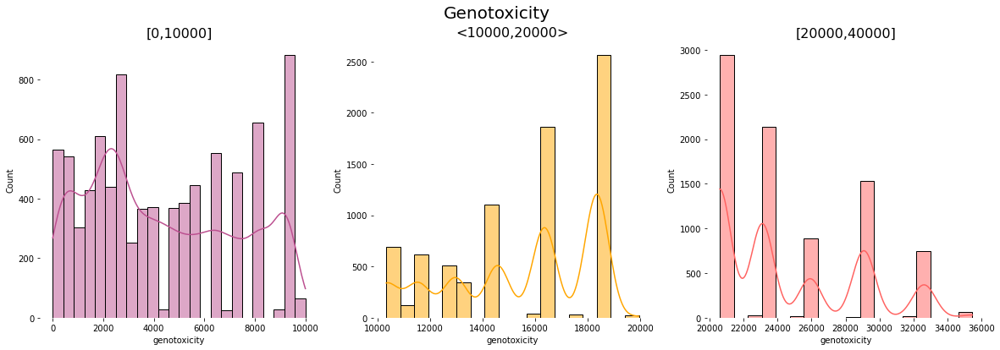

In [12]:
genotoxicity_1 = df_geno2[df_geno2['genotoxicity']<=10000]
genotoxicity_2 = df_geno2[df_geno2['genotoxicity'].between(10000, 20000, inclusive=False)]
genotoxicity_3 = df_geno2[df_geno2['genotoxicity'].between(20000,40000, inclusive=True)]

fig, axes = plt.subplots(1, 3, figsize = (20, 6))
fig.suptitle('Genotoxicity', fontsize=20)
left = sns.histplot(data=genotoxicity_1, x='genotoxicity', ax = axes[0], kde=True, color=colors_palette[2])
center = sns.histplot(data=genotoxicity_2, x='genotoxicity', ax = axes[1], kde=True, color=colors_palette[0])
right = sns.histplot(data=genotoxicity_3, x='genotoxicity', ax = axes[2], kde=True, color=colors_palette[1])
axes[0].set_title('[0,10000]', fontsize=16)
axes[1].set_title('<10000,20000>', fontsize=16)
axes[2].set_title('[20000,40000]', fontsize=16)

sns.despine(left=True, bottom=True)

In [13]:
df_scaled = StandardScaler().fit_transform(df_geno2['genotoxicity'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-1.63008853]
 [-1.6300663 ]
 [-1.62965512]
 [-1.62965512]
 [-1.62965512]
 [-1.62965512]
 [-1.62965512]
 [-1.62965512]
 [-1.62965512]
 [-1.62958844]]

outer range (high) of the distribution:
[[2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]
 [2.31286349]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


### 4.1.3 Calculate logarithm

1. Convert nM to M.
2. Apply -log10.

genotoxicity -> lower values are better: <=15000 nM -> inactive (non-toxic)

logarithm_of genotoxicity -> higher values are better : >=5 -> inactive (non-toxic).

In [14]:
df_geno2 = df_geno2.assign(genotoxicity = -np.log10(df_geno2.genotoxicity*(10**-9)))
df_geno2

,genotoxicity,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,4.949999,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,1,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,1,1,1,1,1,1,1,0
1,4.586390,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,1,1,1,0,1,1,0,0,1,1,0,1,1,1,0,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2,4.786389,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,1,1,0,1,0
3,4.686213,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,0
4,4.536391,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,1,1,1,0,1,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,0,0,0,0,1,1,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,1,0,1,0,1,0,0,0,1,1,1,0,0,1,1,0,0,1,1,0,1,1,0,0,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [15]:
df_geno2['genotoxicity'].describe()

count    24915.000000
mean         4.995891
std          0.490238
min          4.450000
25%          4.686213
50%          4.786389
75%          5.186392
max          9.154902
Name: genotoxicity, dtype: float64

### 4.1.4 Classes statistics 📈

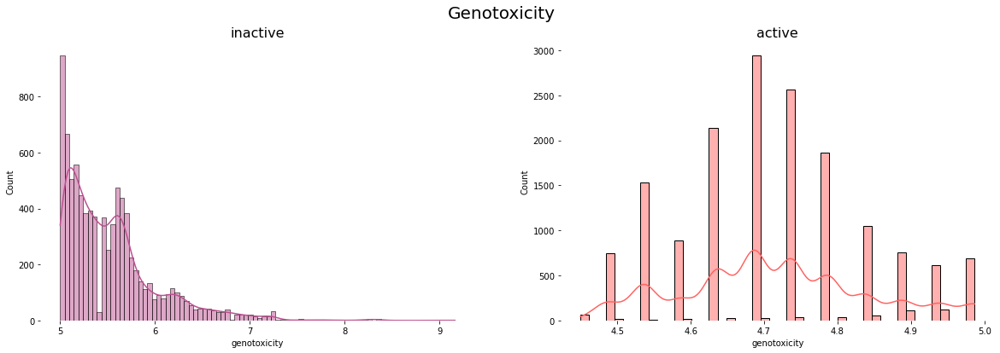

In [16]:
genotoxicity_1 = df_geno2[df_geno2['genotoxicity']<5]
genotoxicity_2 = df_geno2[df_geno2['genotoxicity']>=5] #inactive

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Genotoxicity', fontsize=20)
left = sns.histplot(data=genotoxicity_2, x='genotoxicity', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=genotoxicity_1, x='genotoxicity', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('inactive', fontsize=16)
axes[1].set_title('active', fontsize=16)

sns.despine(left=True, bottom=True)

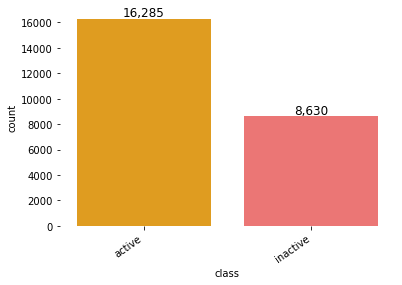

In [17]:
activity_th = []
for i in df_geno2.genotoxicity:
    if float(i) < 5:
        activity_th.append("active")
    elif float(i) >= 5:
        activity_th.append("inactive")
    
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_geno2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'genotoxicity value')

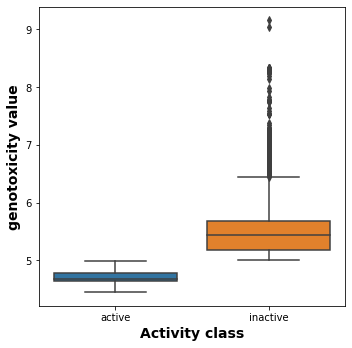

In [18]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'genotoxicity', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('genotoxicity value', fontsize=14, fontweight='bold')

### 4.1.5 Prepare other fingerprints

In [19]:
df_geno_pubch.apply(pd.to_numeric, errors='coerce')
df_geno_pubch = df_geno_pubch.assign(genotoxicity = -np.log10(df_geno_pubch.genotoxicity*(10**-9)))
df_geno_pubch.head()

,genotoxicity,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,P

In [20]:
df_geno_klek.apply(pd.to_numeric, errors='coerce')
df_geno_klek = df_geno_klek.assign(genotoxicity = -np.log10(df_geno_klek.genotoxicity*(10**-9)))
df_geno_klek.head()

genotoxicity  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0      4.949999      0      0      0      0      0      0      0      0   
1      4.586390      1      0      0      0      0      0      0      0   
2      4.786389      1      0      0      0      0      0      0      0   
3      4.686213      0      0      0      0      0      0      0      0   
4      4.536391      1      0      0      0      0      0      0      0   

   KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0      0       0       0       0       0       0       0       0       0   
1      0       0       0       0       0       0       0       0       0   
2      0       0       0       0       0       0       0       0       0   
3      0       0       0       0       0       0       0       0       0   
4      0       0       0       0       0       1       0       0       0   

   KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       1       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP45  KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  \
0       0       0       0       0       0       0       0       0       0   
1       1       0       0       0       1       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP54  KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP63  KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP72  KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0

### 4.1.6 Save

In [21]:
df_geno2.to_csv('data/processed/geno_maccs_all.csv', index=False)
df_geno_pubch.to_csv('data/processed/geno_pubchem_all.csv', index=False)
df_geno_klek.to_csv('data/processed/geno_klek_all.csv', index=False)

## 4.2 SDF 

Prepare SDF file with mols. 

### 4.2.1 Load data

In [22]:
suppl = Chem.SDMolSupplier('data/raw/genotoxicity_from_chembl_data.sdf')
ms = [x for x in suppl if x is not None]
len(ms)

24915

### 2.2.2 Preprocess

Convert mols to smiles.

In [23]:
geno_smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms ]
df_geno_smiles = pd.DataFrame(geno_smiles, columns=['smiles'])
df_geno_smiles

,smiles
0,Cc1ccc(NC(=O)c2cc(-c3cccs3)on2)cc1
1,Cc1ccccc1N(C(=O)c1snc(C(N)=O)c1N)C(C(=O)NCC1CC...
2,C(=NNc1ccccn1)c1c[nH]c2ccccc12
3,CCOC(=O)c1[nH]c(C)c(C(=O)c2ccc(C)cc2)c1C
4,Cc1ccc2nc(-c3cccc(S(=O)(=O)N4CC(C)OC(C)C4)c3)c...
...,...
24910,COc1cccc2c1nc(C)c1cc(C)oc12
24911,Cn1c(S)nnc1CCc1nc2ccccc2[nH]1
24912,CN1C(=O)c2cccc3c(S(=O)(=O)N(C)C)ccc1c23
24913,CC1Oc2ccccc2C=C1C=NNc1ccc(C(=O)O)cc1


In [24]:
df_geno_smiles = df_geno_smiles.join(df_geno2['genotoxicity'])
df_geno_smiles

,smiles,genotoxicity
0,Cc1ccc(NC(=O)c2cc(-c3cccs3)on2)cc1,4.949999
1,Cc1ccccc1N(C(=O)c1snc(C(N)=O)c1N)C(C(=O)NCC1CC...,4.586390
2,C(=NNc1ccccn1)c1c[nH]c2ccccc12,4.786389
3,CCOC(=O)c1[nH]c(C)c(C(=O)c2ccc(C)cc2)c1C,4.686213
4,Cc1ccc2nc(-c3cccc(S(=O)(=O)N4CC(C)OC(C)C4)c3)c...,4.536391
...,...,...
24910,COc1cccc2c1nc(C)c1cc(C)oc12,4.836213
24911,Cn1c(S)nnc1CCc1nc2ccccc2[nH]1,4.736390
24912,CN1C(=O)c2cccc3c(S(=O)(=O)N(C)C)ccc1c23,4.686390
24913,CC1Oc2ccccc2C=C1C=NNc1ccc(C(=O)O)cc1,5.936404


### 4.2.3 Save

In [25]:
df_geno_smiles.to_csv('data/processed/geno_smiles_all.csv', index=False)